<a href="https://colab.research.google.com/github/Makesomenotes/kdd_trading/blob/main/part_2/Model%2BGrad_Signal_Attr_methods.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import gdown
from matplotlib import pyplot as plt
import numpy as np 
import pandas as pd
from tqdm.notebook import tqdm

import torch
import torchvision
import torchvision.transforms as transforms
from PIL import Image
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.nn.functional as F

# Загрузка и распаковка данных

In [2]:
url = 'https://drive.google.com/uc?id=1UnIk64eM2p32GdsaYIIan-09G0kE7Xmt'
output = 'data.zip'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1UnIk64eM2p32GdsaYIIan-09G0kE7Xmt
To: /content/data.zip
100%|██████████| 3.11G/3.11G [00:43<00:00, 71.6MB/s]


'data.zip'

In [ ]:
!unzip data.zip

# Подготовка Dataset and Dataloader

In [2]:
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [3]:
data_dir = 'Fish_Dataset'

classes = []

for directory in os.listdir(data_dir):
    if "." not in directory:
        classes.append(directory)
        
print(classes)

['Black Sea Sprat', 'Gilt-Head Bream', 'Hourse Mackerel', 'Red Mullet', 'Red Sea Bream', 'Sea Bass', 'Shrimp', 'Striped Red Mullet', 'Trout']


In [4]:
image_paths = []
image_classes = []
label_to_class = {}
for i, cls in enumerate(classes):
    label_to_class[i] = cls
    objects = os.listdir(os.path.join(data_dir, cls, cls))
    image_classes += len(objects) * [i]
    image_paths.extend(os.path.join(data_dir, cls, cls, i) for i in objects)

data = pd.DataFrame({'path':image_paths, 'class':image_classes})

In [5]:
data.head(3)

,path,class
0,Fish_Dataset\Black Sea Sprat\Black Sea Sprat\0...,0
1,Fish_Dataset\Black Sea Sprat\Black Sea Sprat\0...,0
2,Fish_Dataset\Black Sea Sprat\Black Sea Sprat\0...,0


In [6]:
transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5),std=(0.5, 0.5, 0.5))
    ])

In [7]:
class MarketFishDataset(Dataset):
    def __init__(self, data, root_dir, transform=transforms.ToTensor()):
        self.data = data
        self.root_dir = root_dir
        self.transform = transform
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        img_name = self.data.iloc[idx, 0]
        image = Image.open(img_name)
        y_label = torch.tensor(self.data.iloc[idx, 1])
        
        if self.transform:
            image = self.transform(image)
    
        return (image, y_label, img_name)

In [8]:
dataset = MarketFishDataset(
    data=data,
    root_dir=data_dir,
    transform=transform
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


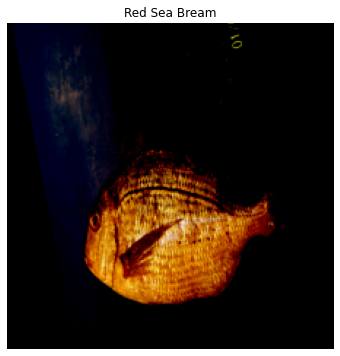

In [9]:
img, lab, img_name = dataset[4100]
plt.figure(figsize=(6, 6))
plt.imshow(img.numpy().transpose((1, 2, 0)))
plt.title(label_to_class[int(lab)])
plt.axis('off')
plt.show()

In [10]:
size = len(dataset)
print(f'Dataset size {size}')

Dataset size 9000


In [11]:
batch_size = 32
train_size = int(size * 0.8)
test_size = size - train_size
train_set, test_set = torch.utils.data.random_split(dataset, [train_size, test_size], generator=torch.Generator().manual_seed(42))
train_loader = DataLoader(dataset=train_set,
                          batch_size=batch_size,
                          shuffle=True)
test_loader = DataLoader(dataset=test_set,
                         batch_size=batch_size,
                         shuffle=True)

In [12]:
batch_example = next(iter(train_loader))
print(f'Image batch size: {batch_example[0].shape}')
print(f'Label batch size: {batch_example[1].shape}')
print(f'Label batch size: {len(batch_example[2])}')

Image batch size: torch.Size([32, 3, 224, 224])
Label batch size: torch.Size([32])
Label batch size: 32


# 1. Создание Нейросети

In [13]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DEVICE

device(type='cuda')

In [14]:
def train(model, optimizer, criterion, epochs, train_loader, test_loader):
    loss_train, loss_test = [], []
    accuracy_train, accuracy_test = [], []

    for epoch in range(epochs):
        model.train()
        corrects = 0
        total = 0
        loss_list = []
        for images, labels, img_name in tqdm(train_loader):
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            loss = criterion(outputs, labels)
            predictions = torch.max(outputs, 1)[1].to(DEVICE)

            total += len(labels)
            corrects += (predictions == labels).sum().item()
            loss_list.append(loss.item())

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        accuracy_train.append(100 * corrects / float(total))
        loss_train.append(np.mean(loss_list))

        model.eval()
        corrects = 0
        total = 0
        loss_list = []
        for images, labels, img_name in tqdm(test_loader):
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            loss = criterion(outputs, labels)
            predict = torch.max(outputs.data, 1)[1].to(DEVICE)

            total += len(labels)
            corrects += (predict == labels).sum().item()
            loss_list.append(loss.item())

        accuracy_test.append(100 * corrects / float(total))
        loss_test.append(np.mean(loss_list))

        print(f"Epoch: {epoch + 1} | Train | Loss: {loss_train[-1]} | Acuracy: {accuracy_train[-1]}")
        print(f"Epoch: {epoch + 1} | Test | Loss: {loss_test[-1]} | Acuracy: {accuracy_test[-1]}\n")
    return accuracy_train, loss_train, accuracy_test, loss_test

### Простая CNN


In [15]:
class CNN(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(CNN, self).__init__()
        self.out_dim = out_dim
        
        self.convs = nn.Sequential(
            nn.Conv2d(in_dim, 8, 8, stride=4, padding=0),
            nn.ReLU(),
            nn.Conv2d(8, 16, 5, stride=2, padding=0),
            nn.ReLU(),
            nn.Conv2d(16, 32, 5, stride=1, padding=0),
            nn.ReLU()
        )
        
        self.linear1 = nn.Linear(22 * 22 * 32, 256)
        self.linear2 = nn.Linear(256, 64)
        self.linear3 = nn.Linear(64, out_dim)
    
    def forward(self, x):
        conv = self.convs(x)
        flattened = conv.reshape(-1, 22 * 22 * 32)
        linear1 = F.relu(self.linear1(flattened))
        linear2 = self.linear2(linear1)
        out = self.linear3(linear2)
        return out

In [16]:
input_dim = dataset[0][0].shape[0] # number of channels (RGB - 3)
output_dim = len(classes) # number of classes
model = CNN(input_dim, output_dim).to(DEVICE)

criterion = nn.CrossEntropyLoss()
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [17]:
# Запускать только при обучении моделей
# epochs = 8
# accuracy_train, loss_train, accuracy_test, loss_test = train(model, optimizer, criterion, epochs, train_loader, test_loader)

In [18]:
# torch.save(model.state_dict(), 'simple_cnn.pth')

In [24]:
# Загрузка весов модели
url = 'https://drive.google.com/uc?id=1ENDvYnc0A4Z3CHwVooqSDdKL9wMmuzC9'
output = 'simple_cnn.pth'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1ENDvYnc0A4Z3CHwVooqSDdKL9wMmuzC9
To: /content/simple_cnn.pth
100%|██████████| 16.0M/16.0M [00:00<00:00, 169MB/s]


'simple_cnn.pth'

In [19]:
model.load_state_dict(torch.load('simple_cnn.pth'))
model.eval()

CNN(
  (convs): Sequential(
    (0): Conv2d(3, 8, kernel_size=(8, 8), stride=(4, 4))
    (1): ReLU()
    (2): Conv2d(8, 16, kernel_size=(5, 5), stride=(2, 2))
    (3): ReLU()
    (4): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
    (5): ReLU()
  )
  (linear1): Linear(in_features=15488, out_features=256, bias=True)
  (linear2): Linear(in_features=256, out_features=64, bias=True)
  (linear3): Linear(in_features=64, out_features=9, bias=True)
)

### Выбор примеров

In [20]:
def print_examples(feature):
  fig, ax = plt.subplots(1, 2, figsize=(12, 8))
  for i in range(2):
    img, lab, img_name = test_set[feature[i]]
    image = Image.open(img_name)
    ax[i].imshow(np.array(image))
    ax[i].set_title(label_to_class[int(lab)])
    ax[i].axis('off')

In [21]:
true_label = []
predicted_label = []
probits = []
for sample in tqdm(test_set):
    image, label, _ = sample
    predict = F.softmax(model(image[None, ...].to(DEVICE)), dim=1)
    true_label.append(int(label))
    predicted_label.append(np.argmax(predict.cpu().detach().numpy()))
    probits.append(predict.cpu().cpu().detach().numpy())

  0%|          | 0/1800 [00:00<?, ?it/s]

In [22]:
index = np.arange(1800)
probits_arr = np.vstack(probits)
true_label_arr = np.vstack(true_label)
predicted_label_arr = np.vstack(predicted_label)

In [23]:
np.random.seed(58)

In [24]:
correctly_classified = (true_label_arr == predicted_label_arr).reshape(-1)
correct_prob = probits_arr[correctly_classified]
corr_index = index[correctly_classified]

sorted_prob = np.argsort(correct_prob.max(axis=1))
max_index_corr = corr_index[np.random.choice(sorted_prob[-300:], 2)]
min_index_corr = corr_index[np.random.choice(sorted_prob[:200], 2)]

In [25]:
incorrectly_classified = (true_label_arr != predicted_label_arr).reshape(-1)
incorrect_prob = probits_arr[incorrectly_classified]
incorr_index = index[incorrectly_classified]

sorted_prob = np.argsort(incorrect_prob.max(axis=1))
max_index_incorr = incorr_index[np.random.choice(sorted_prob[-300:], 2)]
min_index_incorr = incorr_index[np.random.choice(sorted_prob[:200], 2)]
all_indexes = np.hstack((max_index_corr, min_index_corr, max_index_incorr, min_index_incorr))

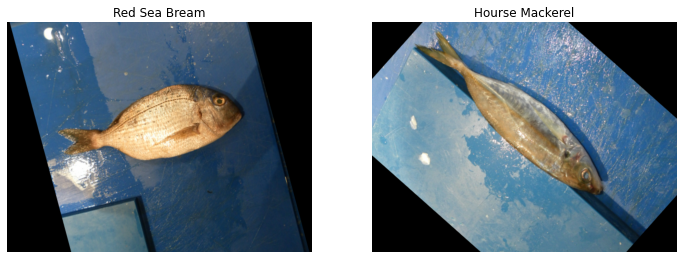

In [26]:
# 2 примера правильно классифицированных с высокой вероятностью принадлежности к классу
print_examples(max_index_corr)

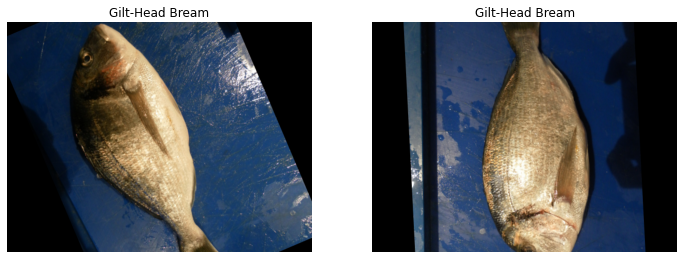

In [27]:
# 2 примера правильно классифицированных с низкой вероятностью принадлежности к классу
print_examples(min_index_corr)

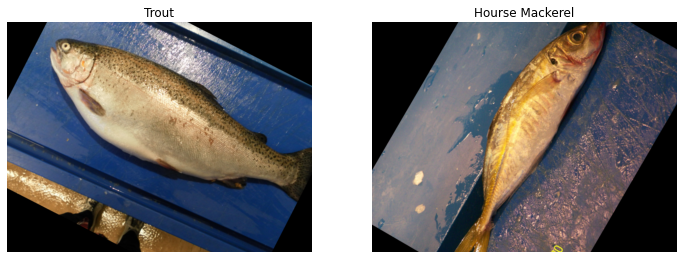

In [28]:
# 2 примера неправильно классифицированных с высокой (с максимально возможной) вероятностью принадлежности к классу
print_examples(max_index_incorr)

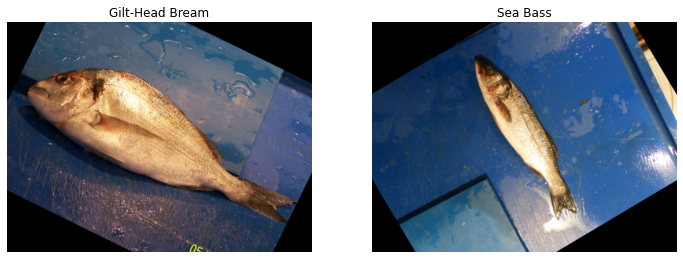

In [29]:
# 2 примера неправильно классифицированных с низкой вероятностью принадлежности к классу
print_examples(min_index_incorr)

# 3. Применение Gradients, Signals and Attribution методов

In [30]:
# !pip install captum

from captum.attr import IntegratedGradients, GuidedBackprop, Saliency
from matplotlib.colors import LinearSegmentedColormap
from captum.attr import visualization as viz
from captum.attr import NoiseTunnel

In [31]:
def method_visualize(feature, method_name):
    transformed_img, label, image_name = test_set[feature]
    image = Image.open(image_name)
    transformed_img = transformed_img.to(DEVICE)

    input = transformed_img
    input = input.unsqueeze(0)

    output = model(input)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)

    pred_label_idx.squeeze_()
    predicted_label = label_to_class[int(pred_label_idx.item())]

    if method_name == 'guided_gradient':
        method = GuidedBackprop(model)
        attributions_ig = method.attribute(input, target=pred_label_idx)
    elif method_name == 'integrated_gradient':
        method = IntegratedGradients(model)
        attributions_ig = method.attribute(input, target=pred_label_idx, n_steps=200)
    elif method_name == 'gradients':
        method = Saliency(model)
        attributions_ig = method.attribute(input, target=pred_label_idx)

    default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                    [(0, '#ffffff'),
                                                      (0.25, '#000000'),
                                                      (1, '#000000')], N=256)

    noise_tunnel = NoiseTunnel(method)

    attributions_ig_nt = noise_tunnel.attribute(input,  nt_type='smoothgrad_sq', target=pred_label_idx)

    _ = viz.visualize_image_attr_multiple(np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1, 2, 0)),
                                np.array(image),
                                methods=["original_image", "heat_map"],
                                signs=['all', 'positive'],
                                titles=[f'Predicted class: {predicted_label} ({prediction_score.squeeze().item():.3f})\nTrue class: {label_to_class[int(label)]}', 'Result'],
                                cmap=default_cmap,
                                show_colorbar=True)

### 3.1 Gradients

C:\Users\FiliVan\AppData\Local\Programs\Python\Python39\lib\site-packages\captum\_utils\gradient.py:56: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


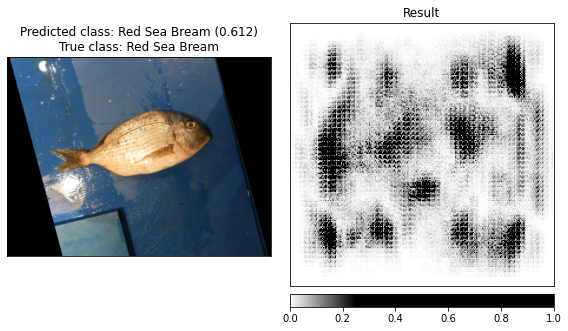

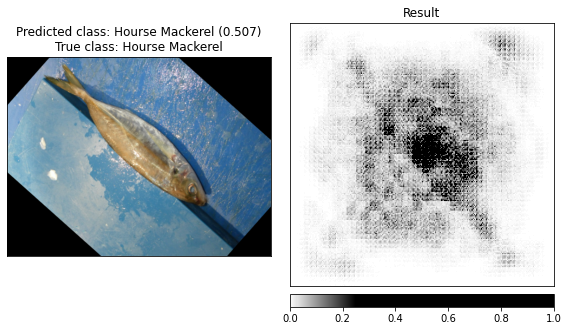

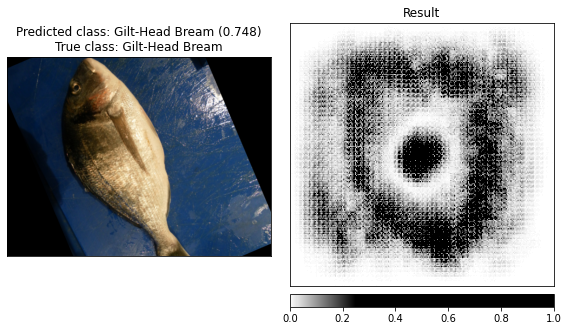

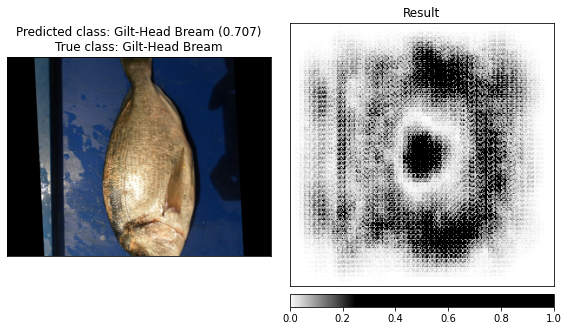

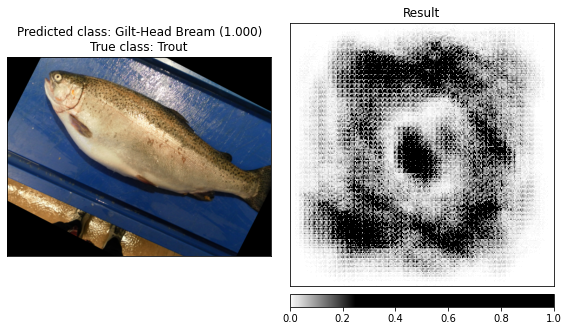

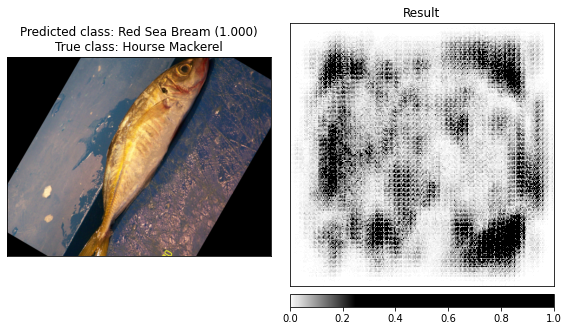

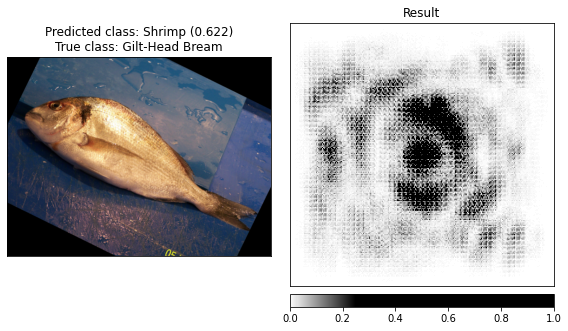

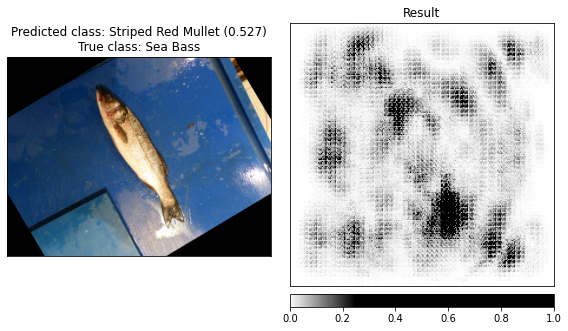

In [32]:
for idx in all_indexes:
    method_visualize(idx, 'gradients')

### 3.2 Guided Backpropagation

C:\Users\FiliVan\AppData\Local\Programs\Python\Python39\lib\site-packages\captum\attr\_core\guided_backprop_deconvnet.py:59: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(


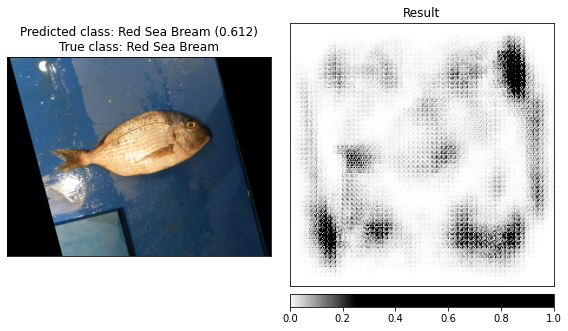

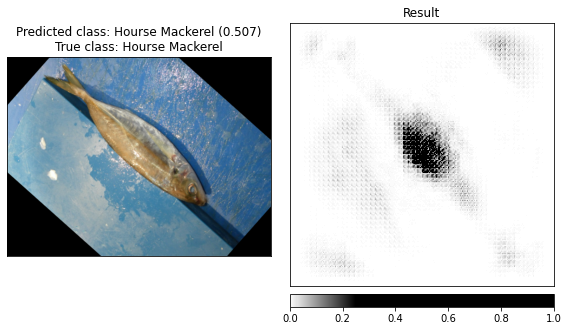

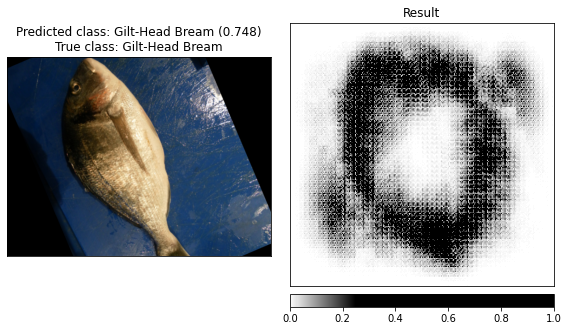

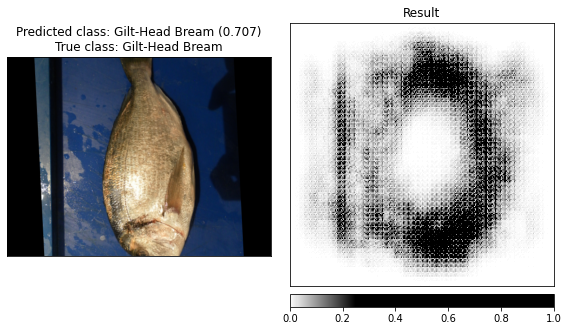

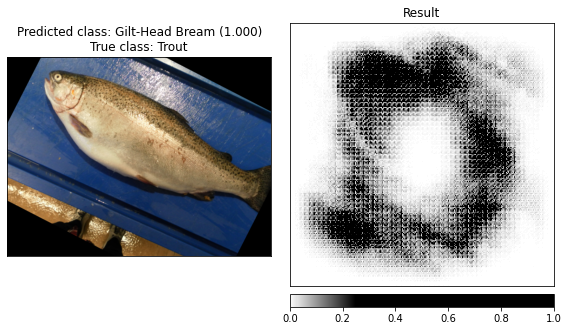

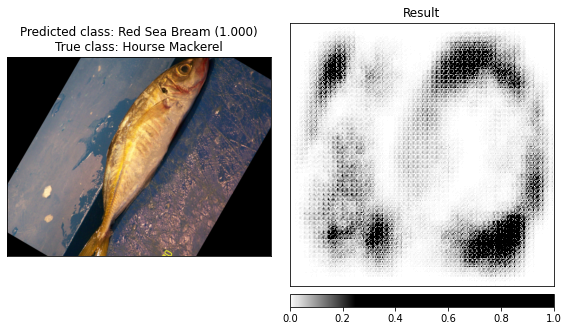

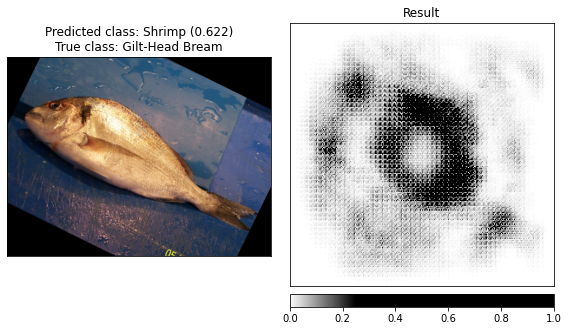

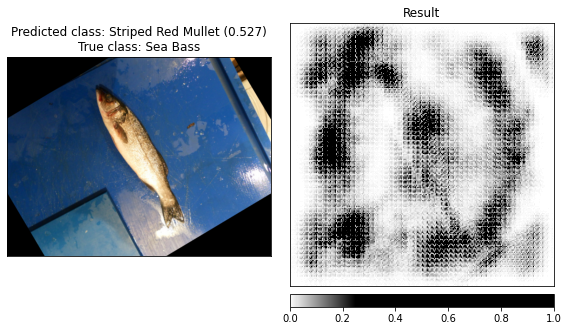

In [33]:
for idx in all_indexes:
    method_visualize(idx, 'guided_gradient')

### 3.3 Integrated Gradient

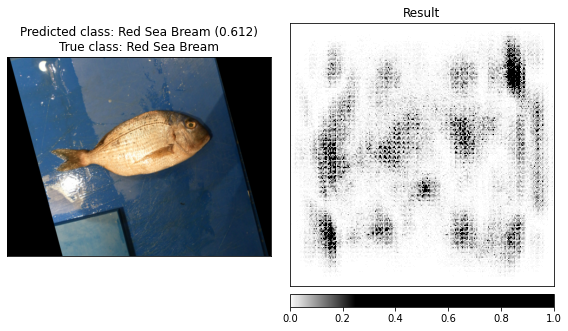

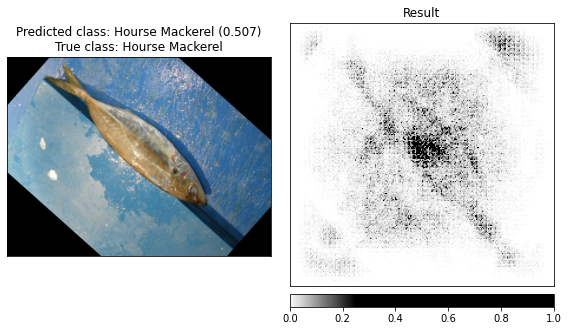

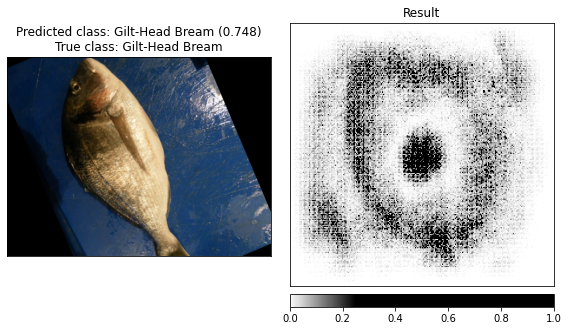

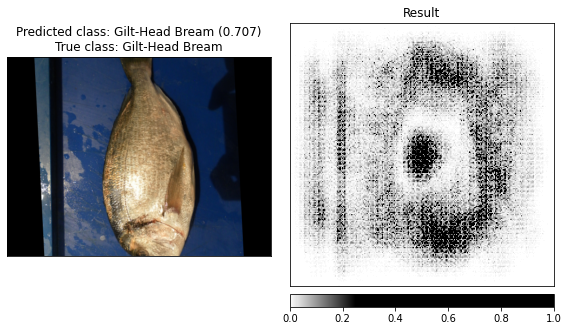

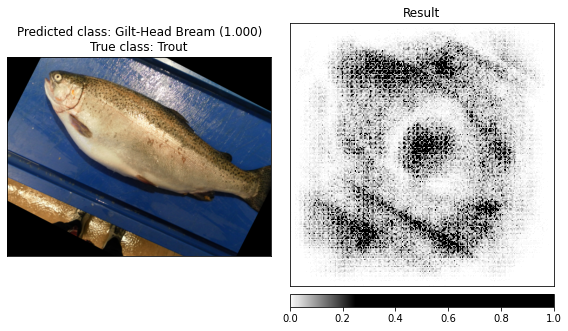

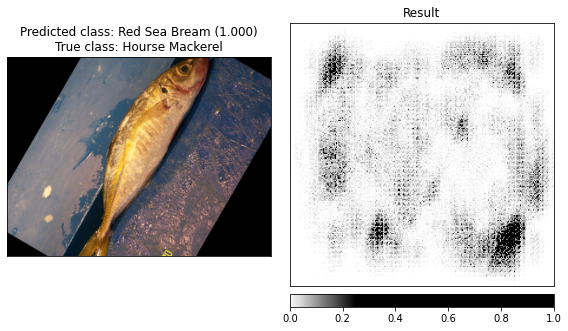

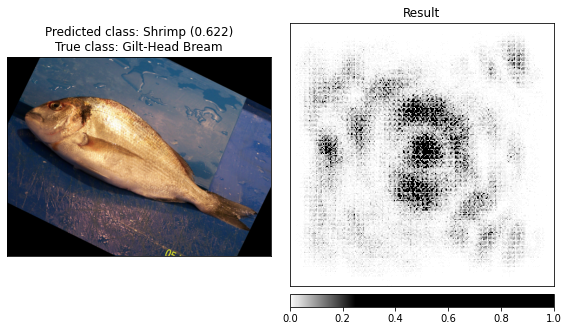

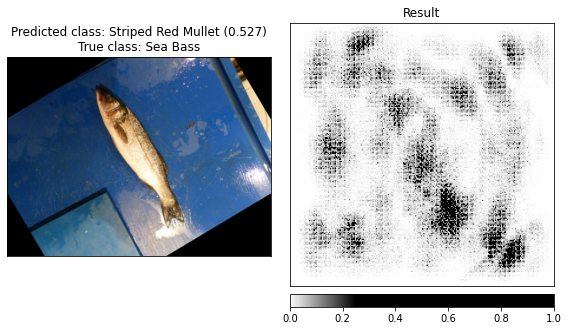

In [34]:
for idx in all_indexes:
    method_visualize(idx, 'integrated_gradient')

## 4. Найти контрфактические/фdversarial примеры для всех 8 примеров 

### Adversarial examples

In [35]:
from captum.robust import FGSM

import warnings
warnings.filterwarnings("ignore")


def image_show(img, label, pred_label, pred_score, adv_img, adv_label, adv_score, epsilon, perturbed_image_coef=5):
    mean=(0.5, 0.5, 0.5)
    std=(0.5, 0.5, 0.5)

    img = img.cpu().squeeze() #.permute(1, 2, 0).detach().numpy()
    adv_img = adv_img.cpu().squeeze() #.squeeze().permute(1, 2, 0).detach().numpy()
    img = img.mul(torch.FloatTensor(std).view(3,1,1)).add(torch.FloatTensor(mean).view(3,1,1)).numpy()
    img = np.transpose(img, (1,2,0))
    img = np.clip(img, 0, 1)
    
    adv_img = adv_img.mul(torch.FloatTensor(std).view(3,1,1)).add(torch.FloatTensor(mean).view(3,1,1)).numpy()
    adv_img = np.transpose(adv_img, (1,2,0))
    adv_img = np.clip(adv_img, 0, 1)



    fig, ax = plt.subplots(1, 3, figsize=(18, 10))
    fig.suptitle(f'True class: {label_to_class[int(label.item())]}', fontsize=20)
    fig.tight_layout()
    fig.subplots_adjust(top=1.25)
    ax[0].imshow(img)
    ax[0].set_title('Clean Example', fontsize=20)
    ax[0].text(0.5,-0.13, f"Prediction: {pred_label}\n Probability: {pred_score}", size=15,
               ha="center",
               transform=ax[0].transAxes,
    )
    ax[1].imshow((adv_img-img)*perturbed_image_coef)
    ax[1].set_title(f'Perturbation (*{perturbed_image_coef})', fontsize=20)
    ax[1].text(0.5,-0.06, f"epsilon: {epsilon}", size=15,
               ha="center",
               transform=ax[1].transAxes,
    ) 
    ax[2].imshow(adv_img)
    ax[2].set_title('Adversarial Example', fontsize=20)
    ax[2].text(0.5,-0.13, f"Prediction: {adv_label}\n Probability: {adv_score}", size=15,
               ha="center",
               transform=ax[2].transAxes,
    )
    ax[0].axis('off')
    ax[1].axis('off')
    ax[2].axis('off')
    ax[0].text(1.05,0.5, "+", size=15, ha="center", 
             transform=ax[0].transAxes)
    ax[1].text(1.05,0.5, " = ", size=15, ha="center", transform=ax[1].transAxes)
    plt.show()

def get_prediction(model, input):
    output = model(input)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)

    pred_label_idx.squeeze_()
    predicted_label = label_to_class[int(pred_label_idx.item())]
    return predicted_label, prediction_score.squeeze().item()

In [36]:
def adversarial_examples_visualize(dataset, epsilon=0.05, targeted=False, perturbed_image_coef=5):
    for data in dataset:
        image, label, _ = test_set[data]
        image = image.to(DEVICE)
        image = image.unsqueeze(0)

        pred_label, prediction_score = get_prediction(model, image)
        
        fgsm = FGSM(model, lower_bound=-1, upper_bound=1)
        perturbed_image_fgsm = fgsm.perturb(image, epsilon=epsilon, target=label, targeted=targeted)
        new_pred_fgsm, score_fgsm = get_prediction(model, perturbed_image_fgsm)
        
        image_show(
            image,
            label,
            pred_label,
            round(prediction_score, 2),
            perturbed_image_fgsm,
            new_pred_fgsm,
            round(score_fgsm, 2),
            epsilon,
            perturbed_image_coef=perturbed_image_coef)
        

### Примеры правильной классификации с высокой вероятностью принадлежности к классу

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


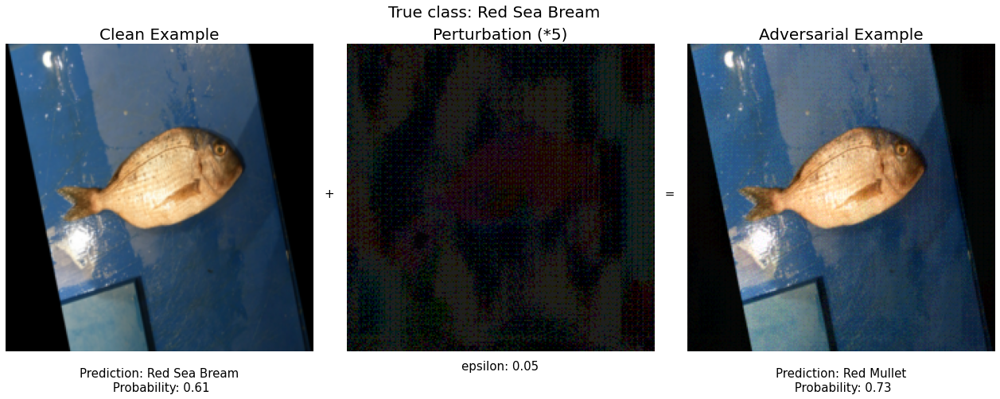

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


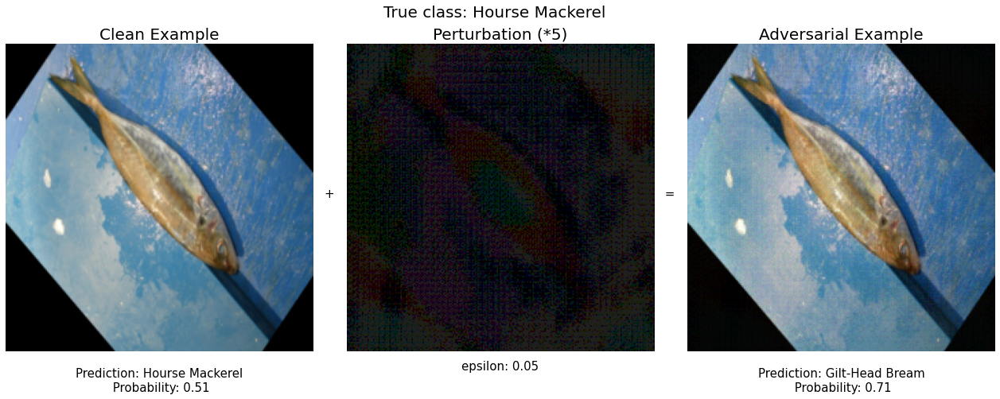

In [37]:
adversarial_examples_visualize(max_index_corr)

***Вывод:*** Для примеров правильной классификации с высокой вероятностью принадлежности к классу Fast Gradient Sign Method (FSGDM) хорошо справляется с adversarial atack даже с небольшим значением величины возмущения (magnitude of the perturbation) epsilon.

### Примеры правильной классификации с низкой вероятностью принадлежности к классу

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


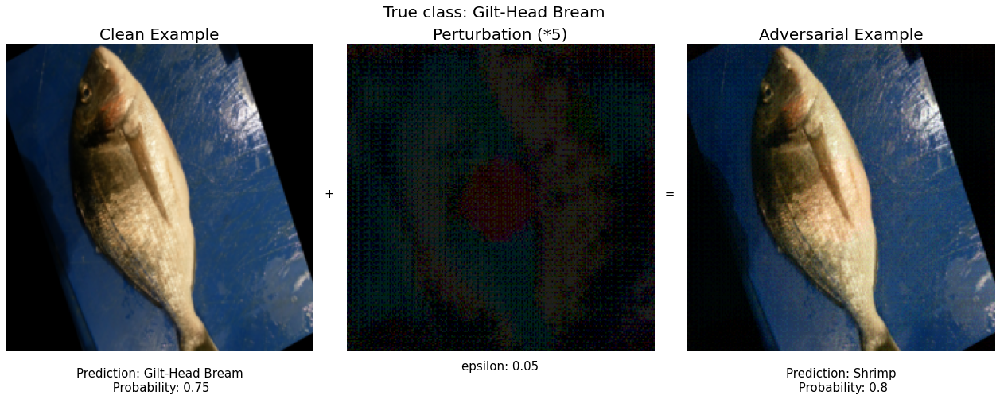

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


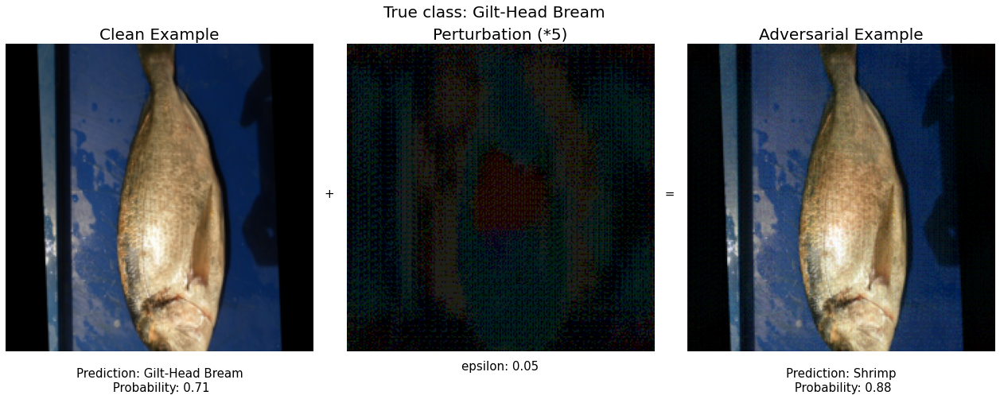

In [38]:
adversarial_examples_visualize(min_index_corr)

***Вывод:*** Для примеров правильной классификации с низкой вероятностью принадлежности к классу модель ошибается на adversarial примере с небольшим значением величины возмущения (magnitude of the perturbation) epsilon.

### Примеры неправильной классификации с высокой (с максимально возможной) вероятностью принадлежности к классу

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


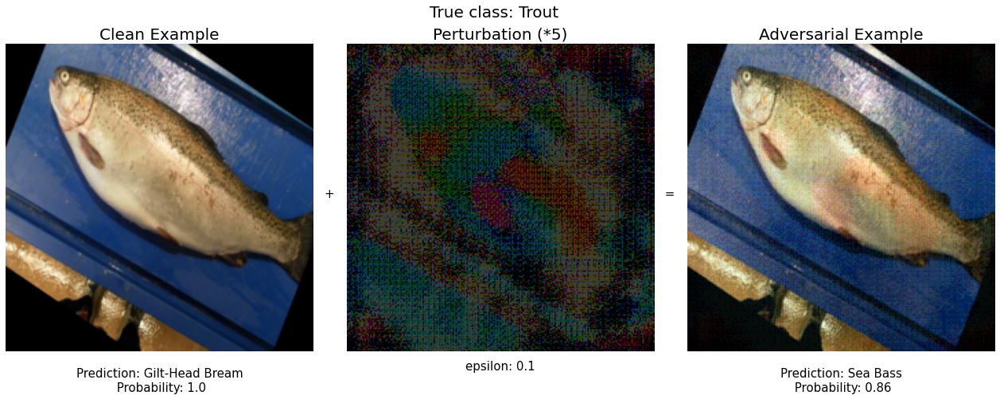

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


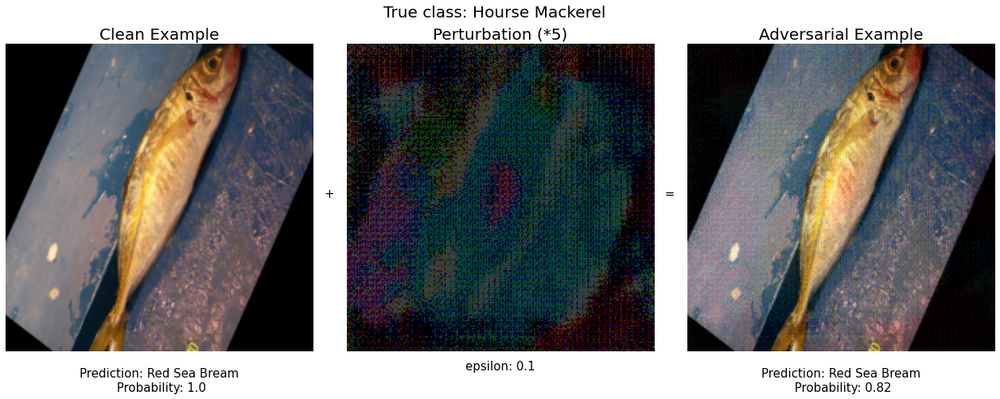

In [39]:
adversarial_examples_visualize(max_index_incorr, epsilon=0.1)

***Вывод:*** Для осуществление adversarial attack на примерах неправильной классификации с высокой (с максимально возможной) вероятностью принадлежности к классу необходимо увеличение значения величины возмущения (magnitude of the perturbation) epsilon.

### Примеры неправильной классификации с низкой вероятностью принадлежности к классу

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


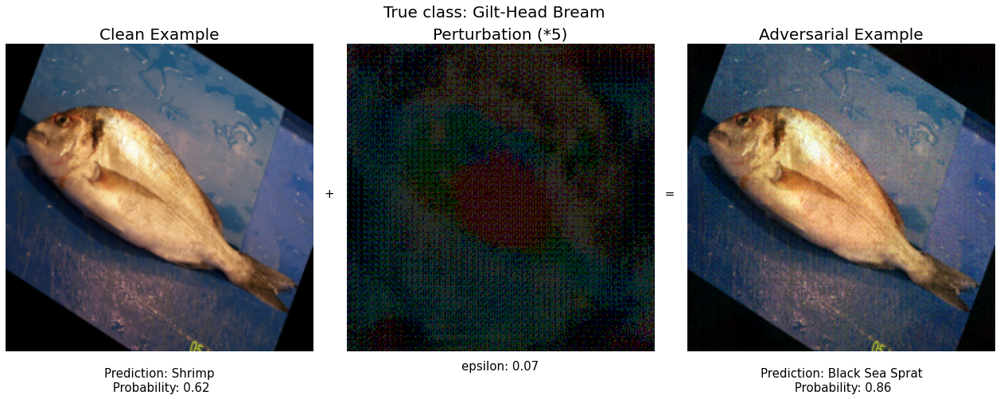

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


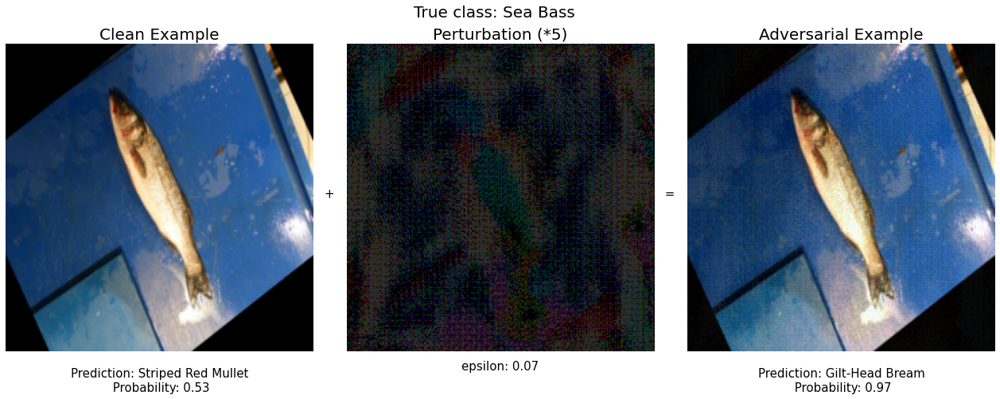

In [40]:
adversarial_examples_visualize(min_index_incorr, epsilon=0.07)

***Вывод:*** Для осуществление adversarial attack на примерах неправильной классификации с низкой вероятностью принадлежности к классу необходимо незначительное увеличение значения величины возмущения (magnitude of the perturbation) epsilon.